<a href="https://colab.research.google.com/github/mamadoz79/Neural_networks_CA3/blob/main/CA3_part1_NN_ECG_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt
import time
import random
import pandas as pd
import os
import itertools
from sklearn.model_selection import train_test_split
from scipy import *
from scipy.linalg import norm, pinv
from scipy.optimize import minimize
from sklearn.cluster import MiniBatchKMeans as kmeans
from matplotlib import pyplot as plt
from numpy import random
import timeit

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


data

In [ ]:
def normalize(df_min_max_scaled):
    for column in df_min_max_scaled.columns:
        df_min_max_scaled[column] = (df_min_max_scaled[column] - df_min_max_scaled[column].min()) / (df_min_max_scaled[column].max() - df_min_max_scaled[column].min())
    return df_min_max_scaled

In [ ]:
data_sets = {}
for i in os.listdir('/content/drive/MyDrive/Time-series/'):
    name = i.split('.')[0]
    data_sets.update({name : pd.read_excel(f"/content/drive/MyDrive/Time-series/{i}", header=None)})
    data_sets[name] = {"target": np.array(data_sets[name].iloc[:,-1:]), "data": np.array(normalize(data_sets[name].iloc[:,:-1]))}

<ipython-input-3-d8db9858f8fc>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_min_max_scaled[column] = (df_min_max_scaled[column] - df_min_max_scaled[column].min()) / (df_min_max_scaled[column].max() - df_min_max_scaled[column].min())
<ipython-input-3-d8db9858f8fc>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_min_max_scaled[column] = (df_min_max_scaled[column] - df_min_max_scaled[column].min()) / (df_min_max_scaled[column].max() - df_min_max_scaled[column].min())


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data_sets['ECG Datasets']['data'], data_sets['ECG Datasets']['target'], test_size=0.3)

GMDH

In [ ]:
class GMDH:
    def __init__(self):
        self.weights = np.array([random.random() for i in range(6)])
        self.etha = 0.01
        self.outputs = []
        self.test_output = []
        self.error_test = []
        self.error_train = []
        self.local_error_test = []
        self.local_error_train = []

    def feed_forward(self, X, target, test_flag):
        self.x1, self.x2 = X
        self.target = target
        self.output = self.dot_product()
        self.error = self.calc_error()
        if not test_flag:
            self.outputs.append(self.output)
            self.local_error_train.append(self.error)
        else:
            self.test_output.append(self.output)
            self.local_error_test.append(self.error)

    def make_error_list(self, arg):
        if arg == 'test':
            self.error_test.append(self.local_error_test)
            self.local_error_test = []
        elif arg == 'train':
            self.error_train.append(self.local_error_train)
            self.local_error_train = []

    def back_propag(self):
        self.weights -= (np.array([1, self.x1, self.x2, self.x1**2, self.x1*self.x2, self.x2**2]) * self.error * -1 * self.etha)

    def dot_product(self):
        return self.weights[0] + self.weights[1]*self.x1 + self.weights[2]*self.x2 + self.weights[3]*(self.x1**2) + self.weights[4]*(self.x1*self.x2) + self.weights[5]*(self.x2**2)

    def calc_error(self):
        return self.target - self.output


In [ ]:
GMDH_neurons = [GMDH() for i in range(3)]

In [ ]:
def GMDH_training(Data, Target, Data_test, Target_test, epoch=200, GMDH_neurons=GMDH_neurons):
    for ep in range(epoch):
        for neuron in GMDH_neurons:
            neuron.outputs = []
        #train part
        for (data, target) in zip(Data, Target):
            [i.feed_forward(j, target[0], False) for (i, j) in zip(GMDH_neurons, list(itertools.combinations(data, 2)))]
            [i.back_propag() for i in GMDH_neurons]
        for ne in GMDH_neurons:
            ne.make_error_list('train')

        for neuron in GMDH_neurons:
            neuron.test_output = []

        for (data, target) in zip(Data_test, Target_test):
            [i.feed_forward(j, target[0], True) for (i, j) in zip(GMDH_neurons, list(itertools.combinations(data, 2)))]
        for ne in GMDH_neurons:
            ne.make_error_list('test')

    for neuron in GMDH_neurons:
        neuron.outputs = np.array(neuron.outputs)

In [ ]:
GMDH_training(X_train, y_train, X_test, y_test)

In [ ]:
rbf_x_train = np.array(list(zip(*[i.outputs for i in GMDH_neurons])))

In [ ]:
rbf_x_test = np.array(list(zip(*[i.test_output for i in GMDH_neurons])))

RBF

In [ ]:
def gaussian(x, mean, sigma):
    sumation = np.sum(np.power((x - mean), 2), 1)
    return np.exp(-0.5 * (1/np.power(np.transpose(sigma), 2)) * sumation)

def gaussian_deriviate_mean(x, mean, sigma, o1):
    sumation = x - mean
    return (1/np.power(sigma, 2)) * sumation * np.transpose(o1)

def gaussian_deriviate_sigma(x, mean, sigma, o1):
    sumation = np.sum(np.power((x - mean), 2), 1)
    sumation = np.reshape(sumation, (-1, 1))
    return (1/np.power(sigma, 3)) * sumation * np.transpose(o1)

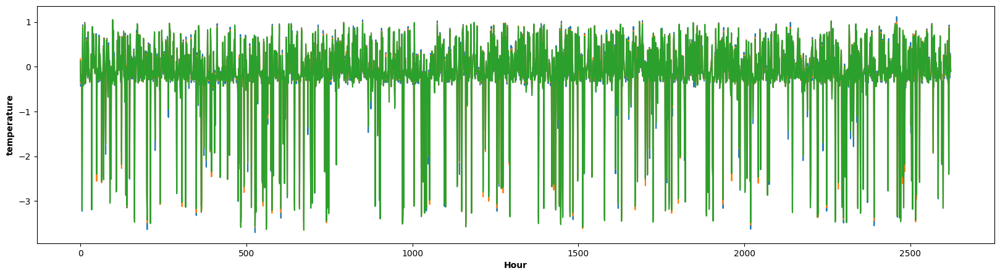

In [ ]:
data_T = rbf_x_train[:]
data_P = rbf_x_train[:]
plt.figure(figsize=(20,5))
plt.plot(data_P)
plt.xlabel('Hour', fontweight ='bold')
plt.ylabel('temperature', fontweight ='bold')
plt.show()

In [ ]:
l1_neurons = 3
l2_neurons = 1
lrw = 0.05
lrm = 0.05
lrs = 0.05
epochs = 200

MSE_train = []
MSE_test = []

In [ ]:
input_dimension = np.shape(rbf_x_train)[1]

In [ ]:
mean = np.random.uniform(low=-1, high=1, size=(l1_neurons, input_dimension))
sigma = np.random.uniform(low=-1, high=1, size=(l1_neurons, l2_neurons))
w = np.random.uniform(low=-1, high=1, size=(l1_neurons, l2_neurons))

In [ ]:
def Train(w, mean, sigma):
    output_train = []
    sqr_err_epoch_train = []

    for i in range(np.shape(rbf_x_train)[0]):
        #x = np.reshape(rbf_x_train[i], (1,-1)) # x: (1, 4)
        x = rbf_x_train[i][:]
        # Feed-Forward
        # Layer 1
        o1 = gaussian(x, mean, sigma) # o1: (1, l1_neurons)
        # Layer 2
        o2 = np.matmul(o1, w) # o2: (1, 1)

        output_train.append(o2[0])

        # Error
        err = y_train[i] - o2[0]
        sqr_err_epoch_train.append(err**2)

        # Back propagation
        mean = np.subtract(mean, (lrm * err * -1 * w * gaussian_deriviate_mean(x, mean, sigma, o1)))
        #
        sigma = np.subtract(sigma, (lrs * err * -1 * w * gaussian_deriviate_sigma(x, mean, sigma, o1)))
        #
        w = np.subtract(w, (lrw * err * -1 * np.transpose(o1)))

    mse_epoch_train = 0.5 * ((sum(sqr_err_epoch_train))/np.shape(rbf_x_train)[0])
    MSE_train.append(mse_epoch_train[0])
    return output_train, w, mean, sigma

def Test(w, mean, sigma):
    sqr_err_epoch_test = []
    output_test = []

    for i in range(np.shape(rbf_x_test)[0]):
        x = np.reshape(rbf_x_test[i], (1,-1))
        # Feed-Forward
        # Layer 1
        o1 = gaussian(x, mean, sigma)
        # Layer 2
        o2 = np.matmul(o1, w)

        output_test.append(o2[0])

        # Error
        err = y_test[i] - o2[0]
        sqr_err_epoch_test.append(err ** 2)

    mse_epoch_test = 0.5 * ((sum(sqr_err_epoch_test))/np.shape(rbf_x_test)[0])
    MSE_test.append(mse_epoch_test[0])
    return output_test

In [ ]:
def Plot_results(output_train,
                 output_test,
                 m_train,
                 b_train,
                 m_test,
                 b_test):
    # Plots
    fig = plt.figure()
    fig.set_size_inches(25, 15)

    axs = fig.add_subplot(3, 2, 1)
    axs.plot(MSE_train, 'b')
    axs.set_title('MSE Train')
    axs = fig.add_subplot(3, 2, 2)
    axs.plot(MSE_test, 'r')
    axs.set_title('Mse Test')
    #
    axs = fig.add_subplot(3, 2, 3)
    axs.plot(y_train, 'b')
    axs.plot(output_train, 'r')
    axs.set_title('Output Train')
    axs = fig.add_subplot(3, 2, 4)
    axs.plot(y_test, 'b')
    axs.plot(output_test, 'r')
    axs.set_title('Output Test')
    #
    axs = fig.add_subplot(3, 2, 5)
    axs.plot(y_train, output_train, 'b*')
    axs.plot(y_train, m_train*y_train+b_train,'r')
    axs.set_title('Regression Train')
    axs = fig.add_subplot(3, 2, 6)
    axs.plot(y_test, output_test, 'b*')
    axs.plot(y_test, m_test*y_test+b_test,'r')
    axs.set_title('Regression Test')
    plt.show()
    time.sleep(1)
    plt.close(fig)

==> Start Training ...


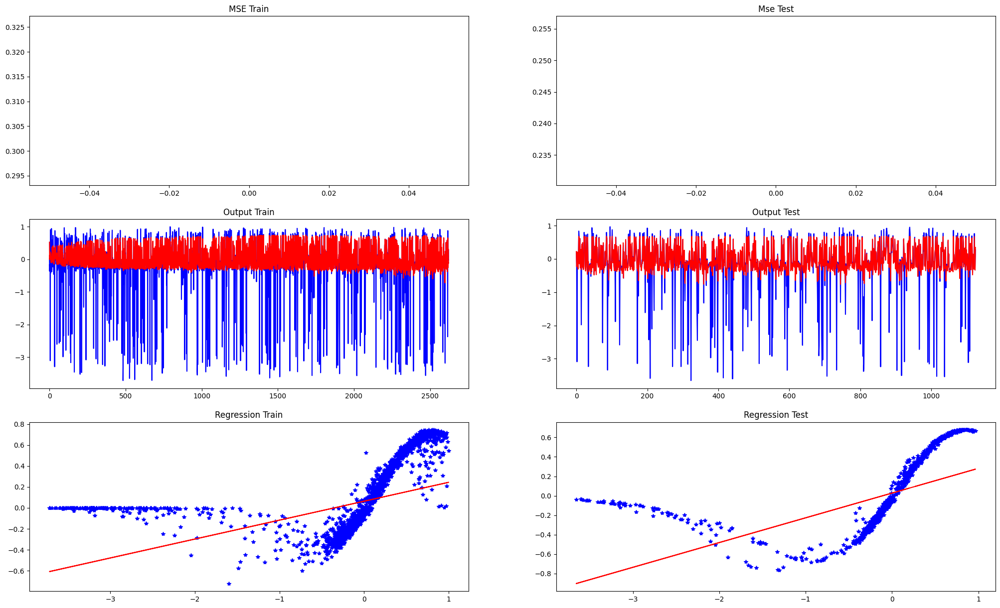

Epoch: 1 	, time: 2.504
MSE_train: 0.3101 	, MSE_test: 0.2436
[0.18044123] [0.06343128] [0.25442925] [0.02771984]


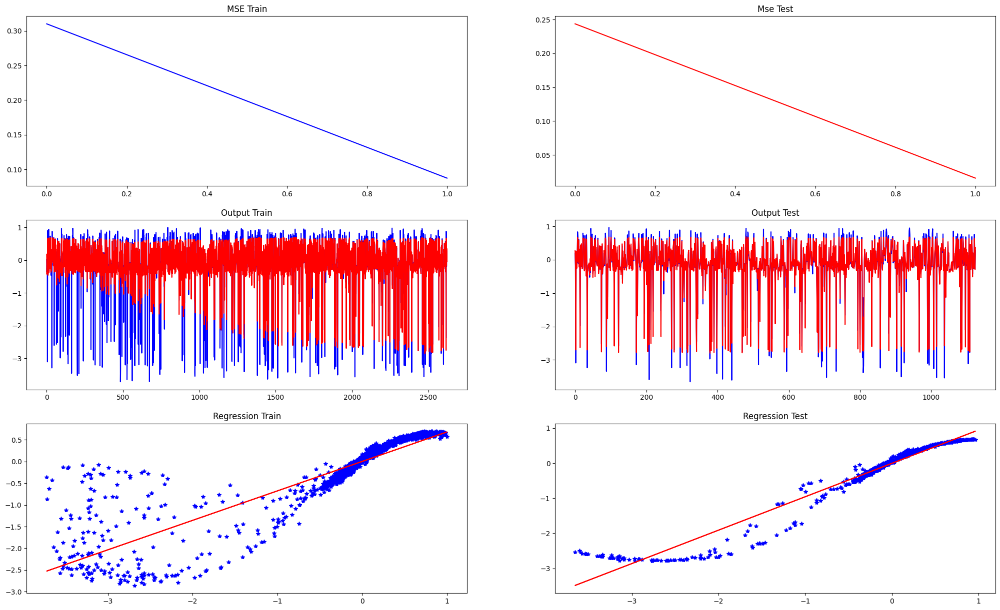

Epoch: 2 	, time: 3.799
MSE_train: 0.0873 	, MSE_test: 0.0157
[0.67884809] [0.000216] [0.95261427] [-0.00616986]


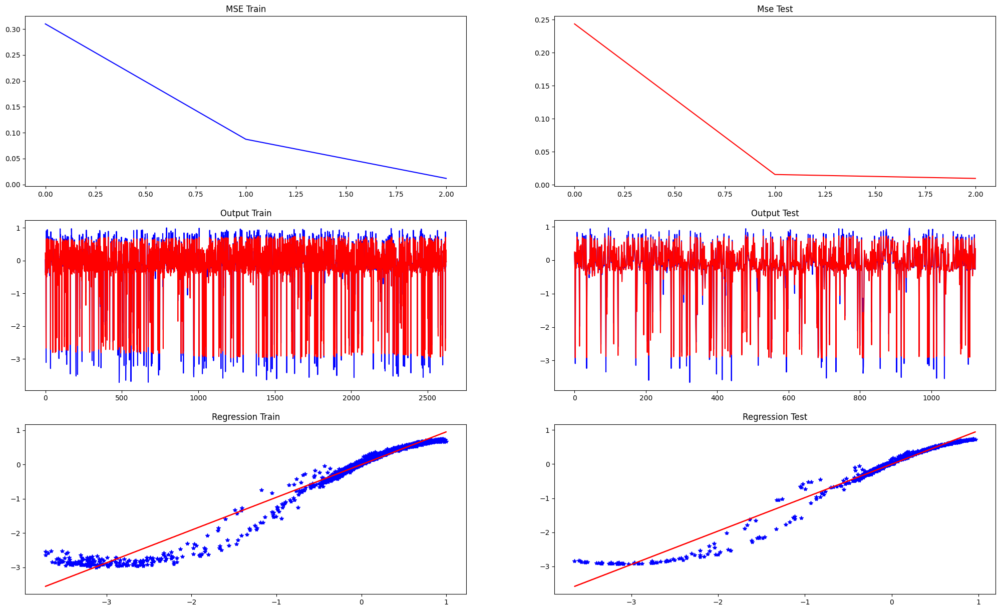

Epoch: 3 	, time: 2.518
MSE_train: 0.0116 	, MSE_test: 0.0098
[0.95421271] [-0.00444467] [0.98066661] [-0.00100814]


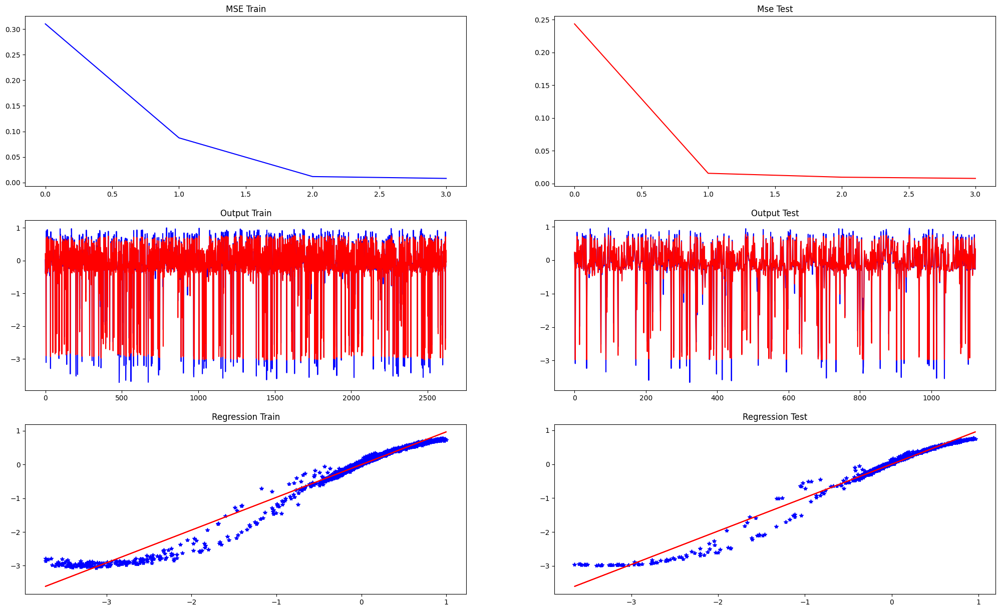

Epoch: 4 	, time: 2.512
MSE_train: 0.0080 	, MSE_test: 0.0079
[0.97086933] [-0.00367176] [0.98707069] [0.00092631]


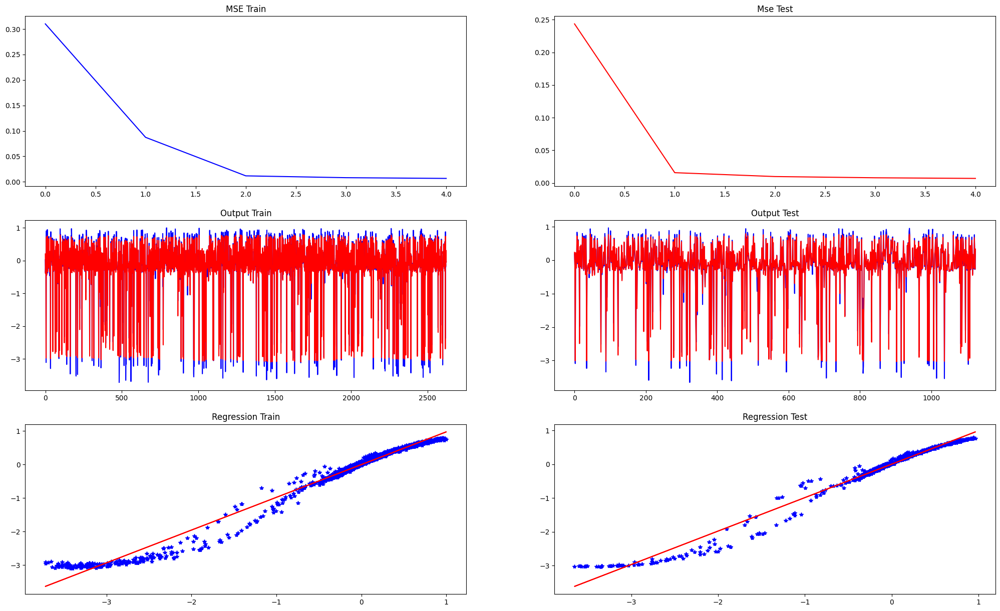

Epoch: 5 	, time: 2.812
MSE_train: 0.0066 	, MSE_test: 0.0069
[0.97675298] [-0.00322646] [0.99011976] [0.00195965]


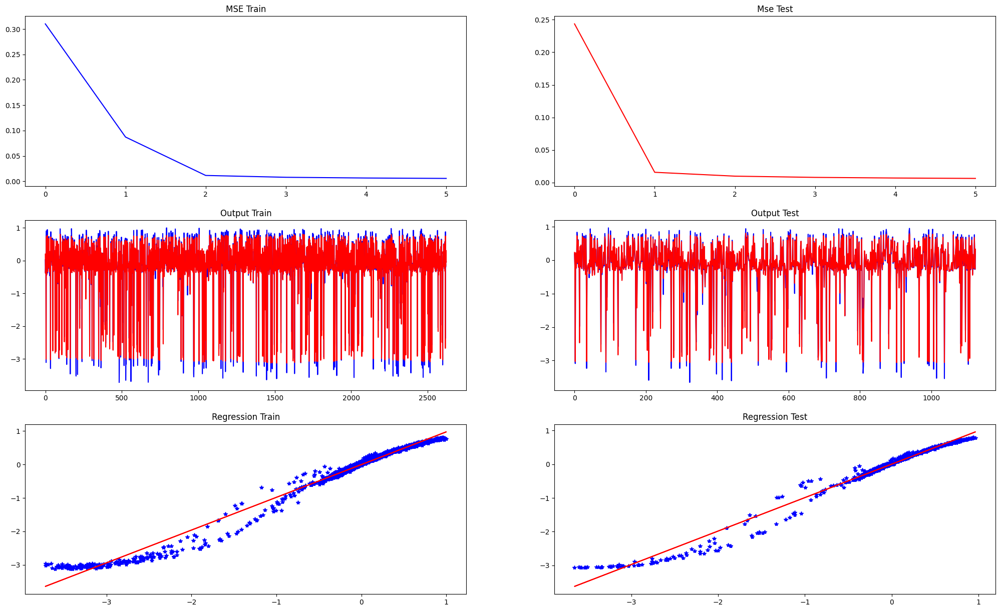

Epoch: 6 	, time: 2.571
MSE_train: 0.0058 	, MSE_test: 0.0063
[0.97997512] [-0.00294297] [0.9919256] [0.0026176]


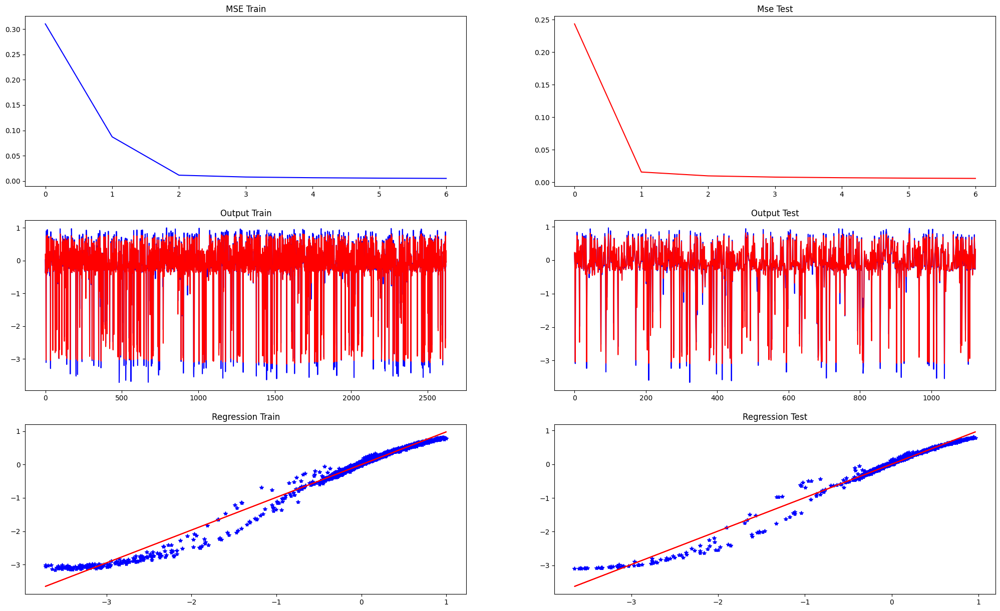

Epoch: 7 	, time: 3.344
MSE_train: 0.0052 	, MSE_test: 0.0059
[0.98205831] [-0.00274194] [0.99312635] [0.0030812]


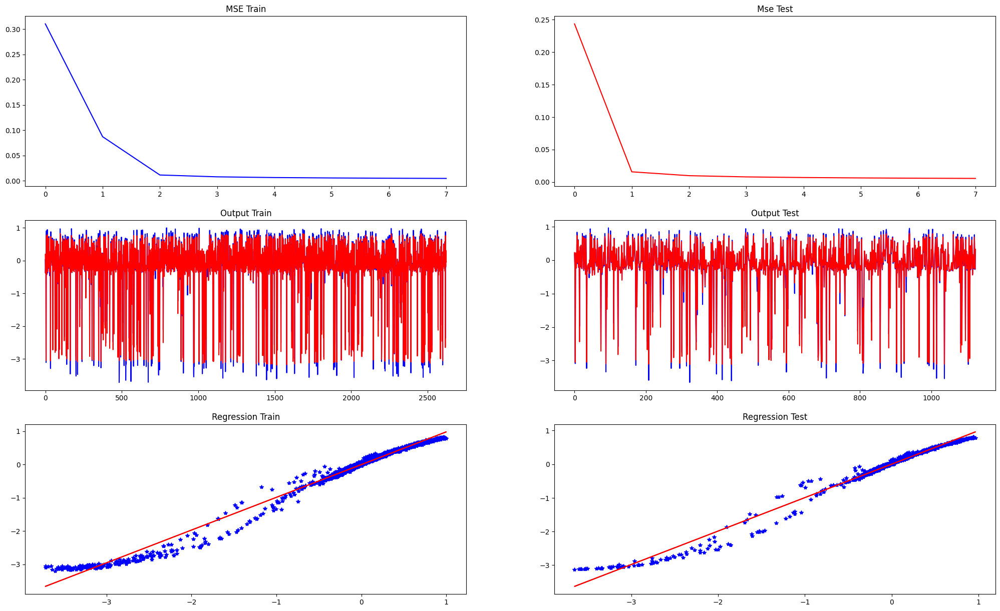

Epoch: 8 	, time: 2.884
MSE_train: 0.0049 	, MSE_test: 0.0055
[0.98353728] [-0.00258889] [0.9939855] [0.00342979]


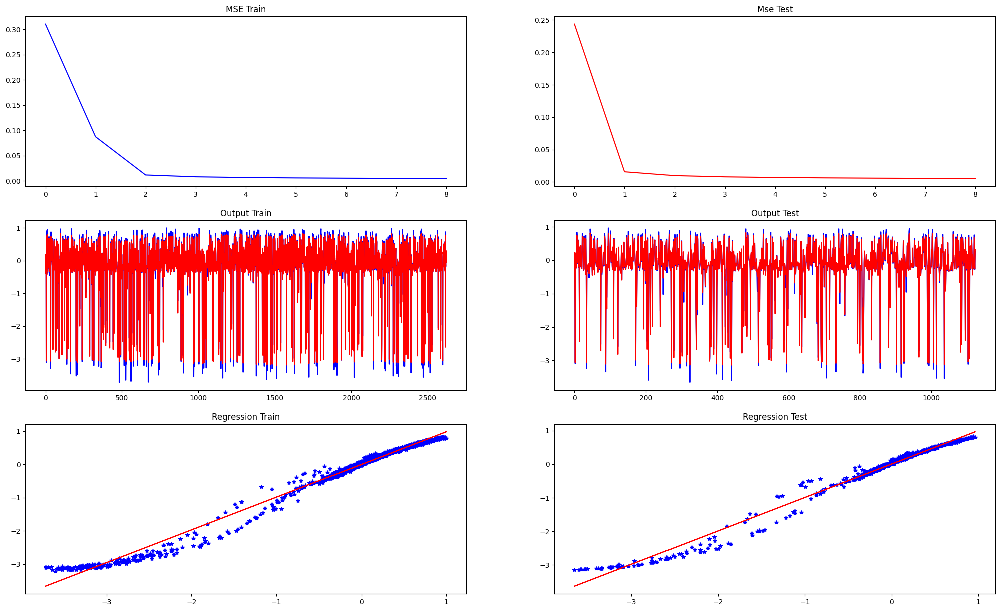

Epoch: 9 	, time: 3.221
MSE_train: 0.0046 	, MSE_test: 0.0053
[0.98465315] [-0.00246665] [0.99463237] [0.003704]


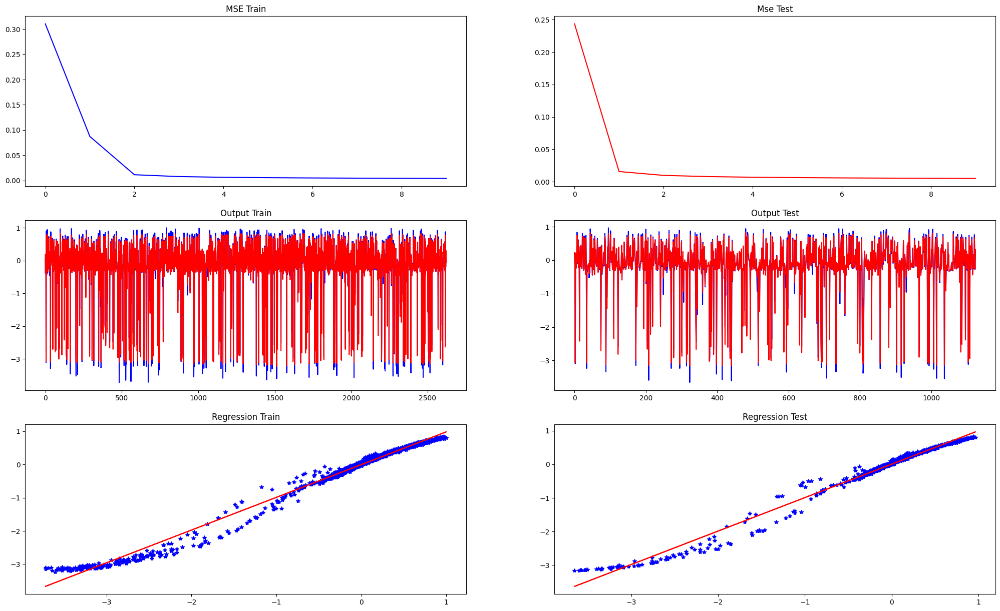

Epoch: 10 	, time: 2.783
MSE_train: 0.0043 	, MSE_test: 0.0051
[0.98553192] [-0.00236563] [0.99513801] [0.00392692]


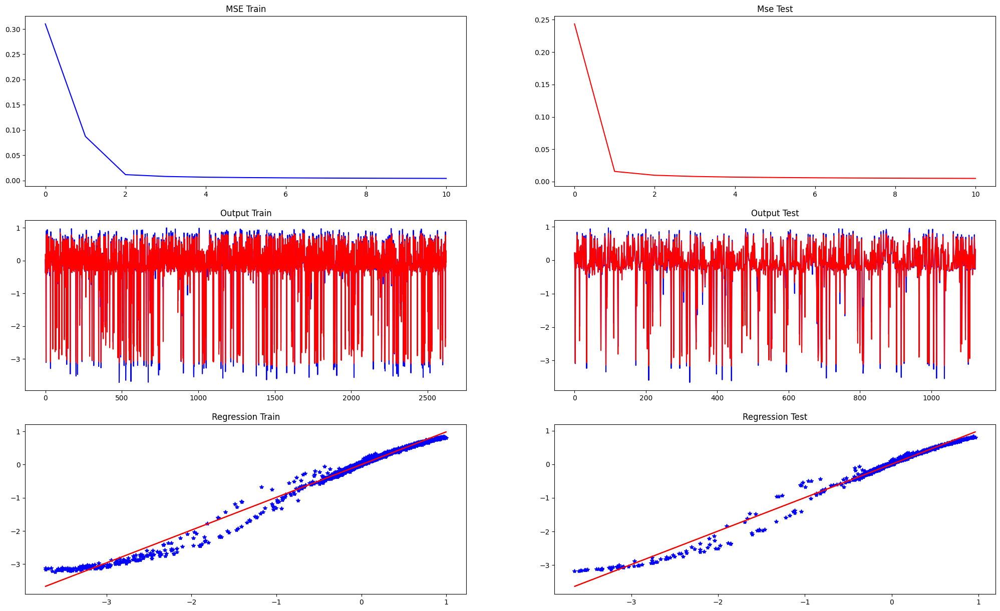

Epoch: 11 	, time: 3.071
MSE_train: 0.0041 	, MSE_test: 0.0049
[0.98624633] [-0.00228003] [0.99554481] [0.00411275]


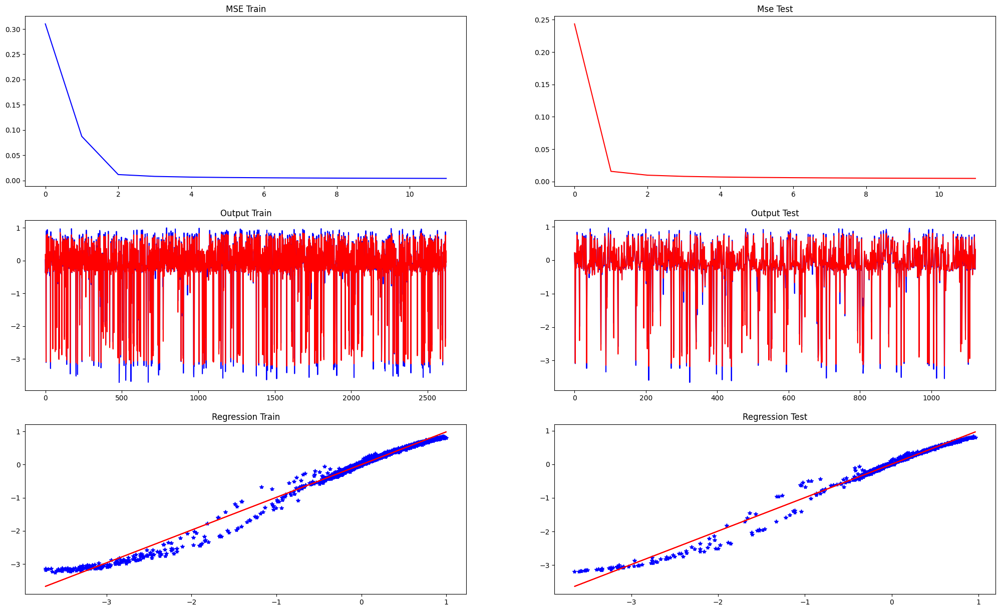

Epoch: 12 	, time: 3.092
MSE_train: 0.0040 	, MSE_test: 0.0047
[0.98684156] [-0.00220607] [0.99587962] [0.00427075]


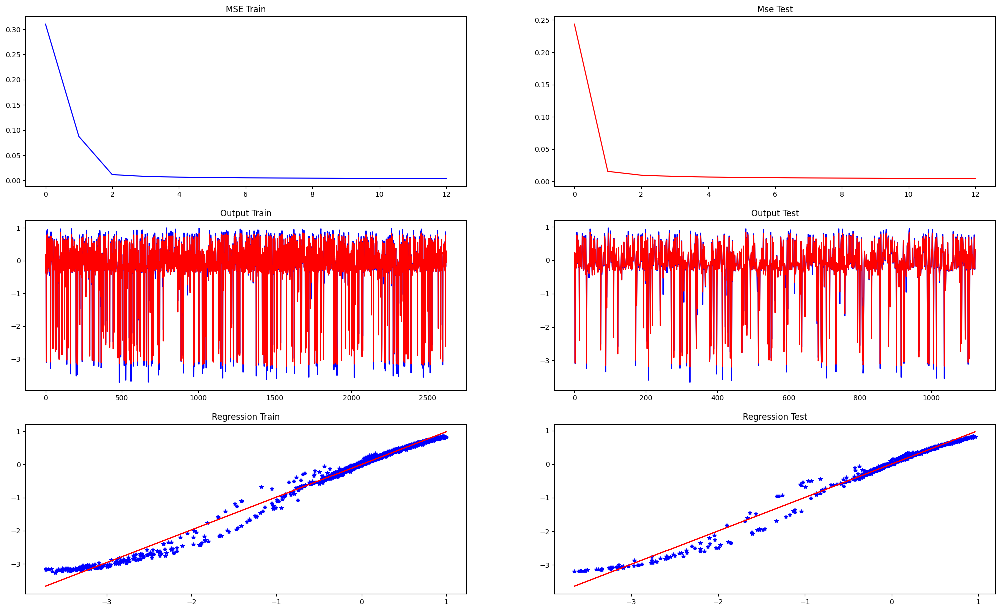

Epoch: 13 	, time: 2.841
MSE_train: 0.0038 	, MSE_test: 0.0046
[0.98734725] [-0.00214121] [0.99616032] [0.00440726]


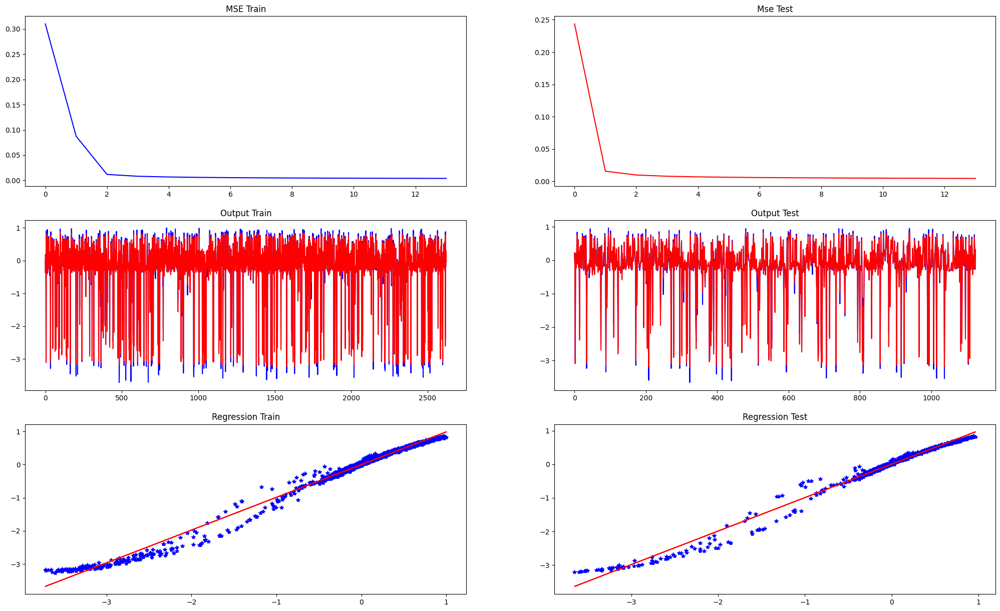

Epoch: 14 	, time: 2.522
MSE_train: 0.0037 	, MSE_test: 0.0045
[0.98778374] [-0.00208361] [0.99639927] [0.00452675]


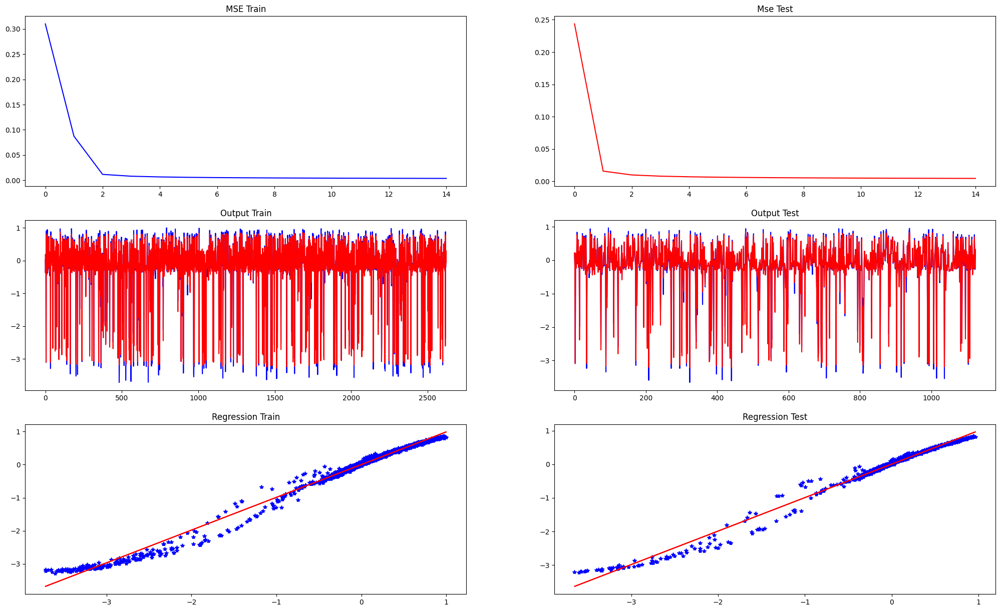

Epoch: 15 	, time: 2.587
MSE_train: 0.0036 	, MSE_test: 0.0044
[0.98816546] [-0.00203195] [0.99660532] [0.0046325]


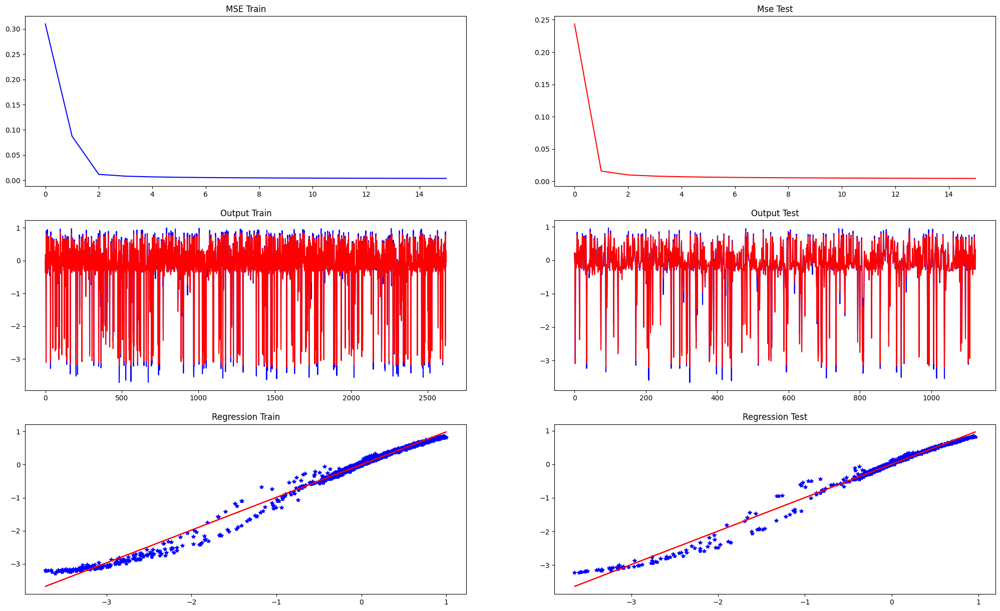

Epoch: 16 	, time: 2.955
MSE_train: 0.0035 	, MSE_test: 0.0043
[0.988503] [-0.00198523] [0.99678493] [0.00472696]


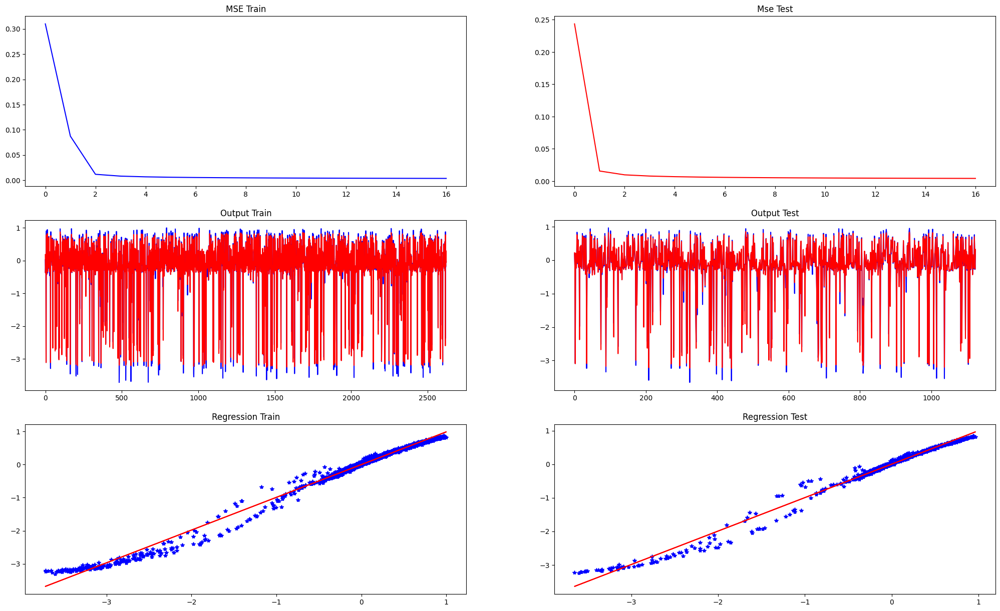

Epoch: 17 	, time: 3.423
MSE_train: 0.0034 	, MSE_test: 0.0042
[0.98880428] [-0.00194265] [0.99694299] [0.00481204]


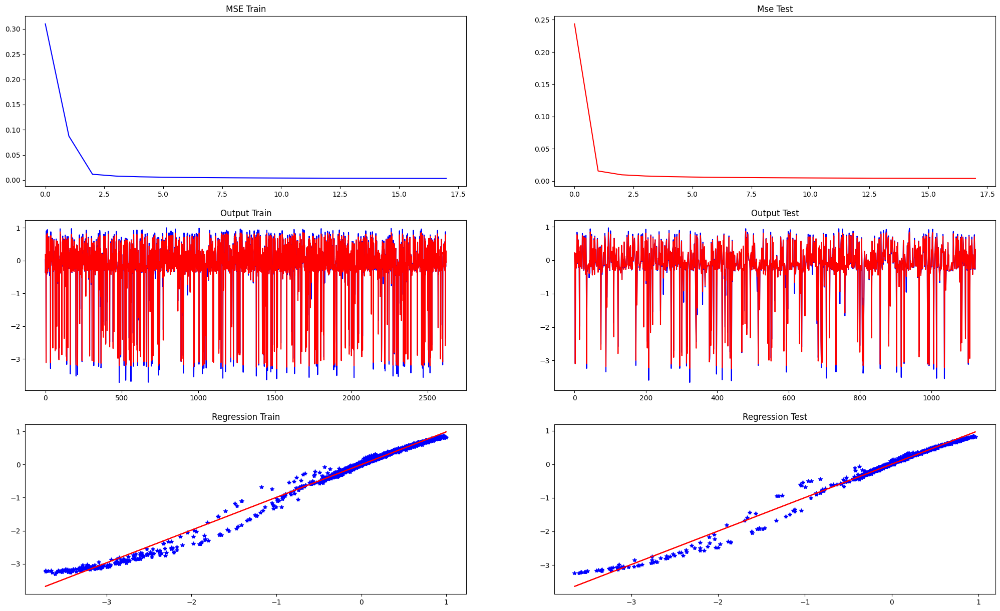

Epoch: 18 	, time: 2.688
MSE_train: 0.0034 	, MSE_test: 0.0041
[0.9890754] [-0.00190363] [0.99708322] [0.00488919]


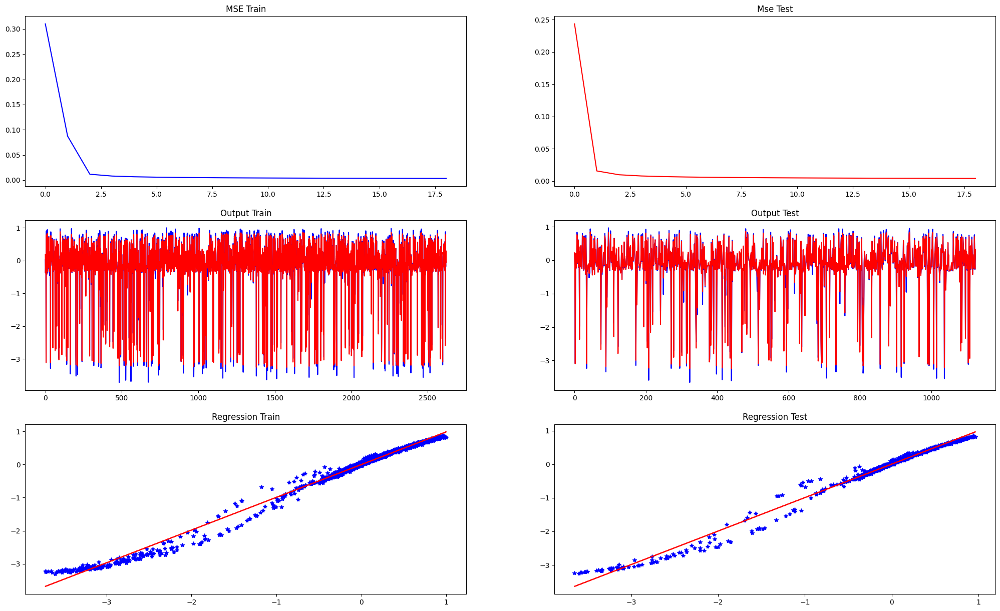

Epoch: 19 	, time: 2.587
MSE_train: 0.0033 	, MSE_test: 0.0041
[0.98932109] [-0.00186766] [0.99720852] [0.00495958]


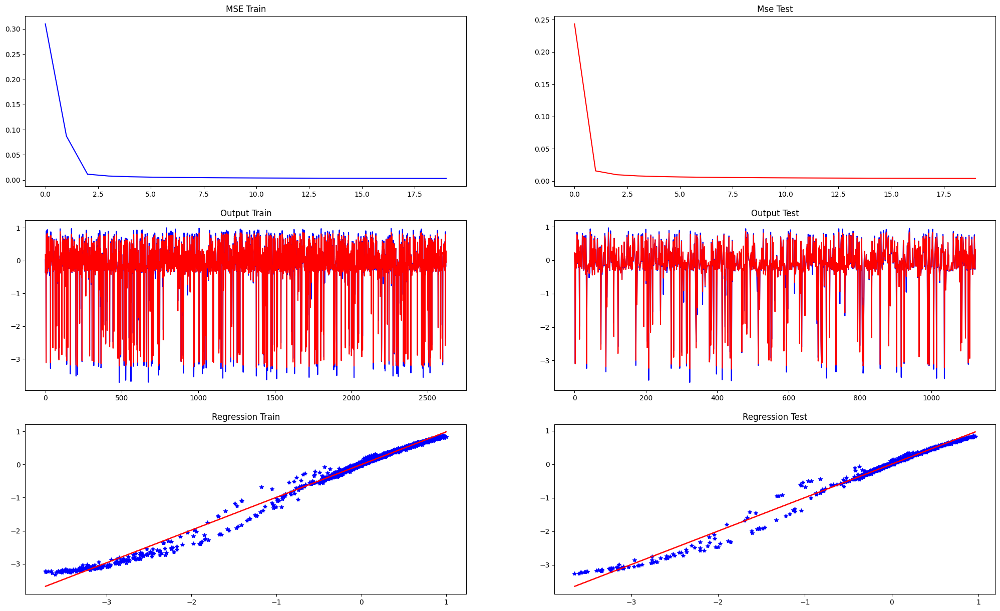

Epoch: 20 	, time: 2.916
MSE_train: 0.0032 	, MSE_test: 0.0040
[0.98954512] [-0.00183435] [0.9973212] [0.00502416]


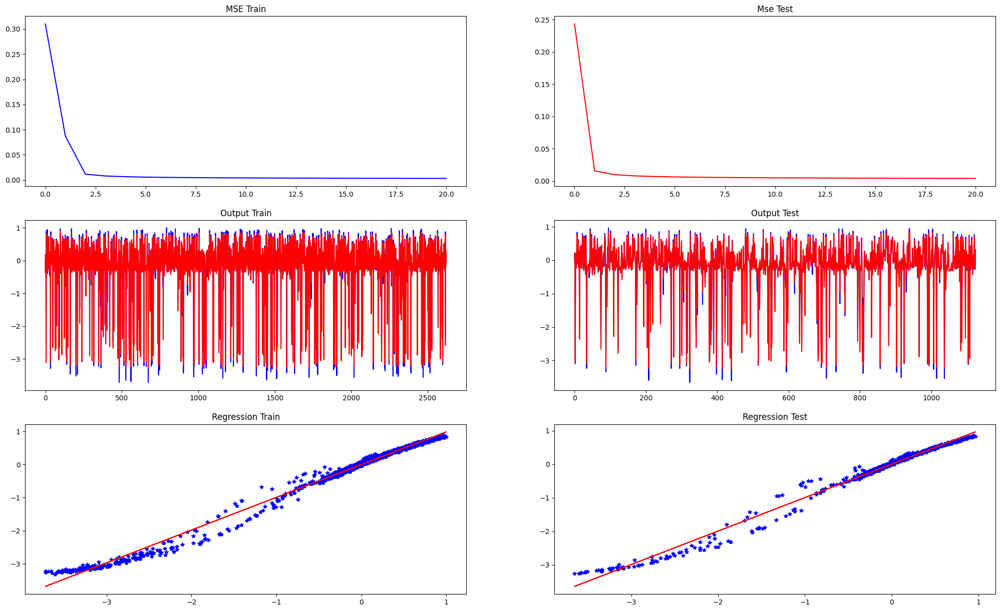

Epoch: 21 	, time: 3.495
MSE_train: 0.0032 	, MSE_test: 0.0040
[0.98975053] [-0.00180339] [0.9974231] [0.00508369]


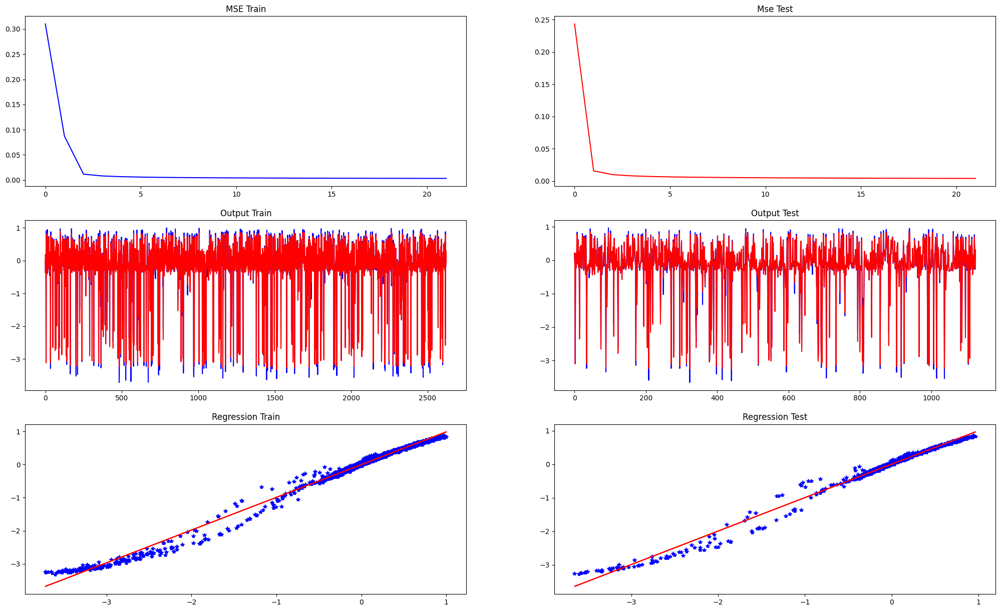

Epoch: 22 	, time: 2.759
MSE_train: 0.0031 	, MSE_test: 0.0039
[0.98993979] [-0.00177448] [0.99751572] [0.00513881]


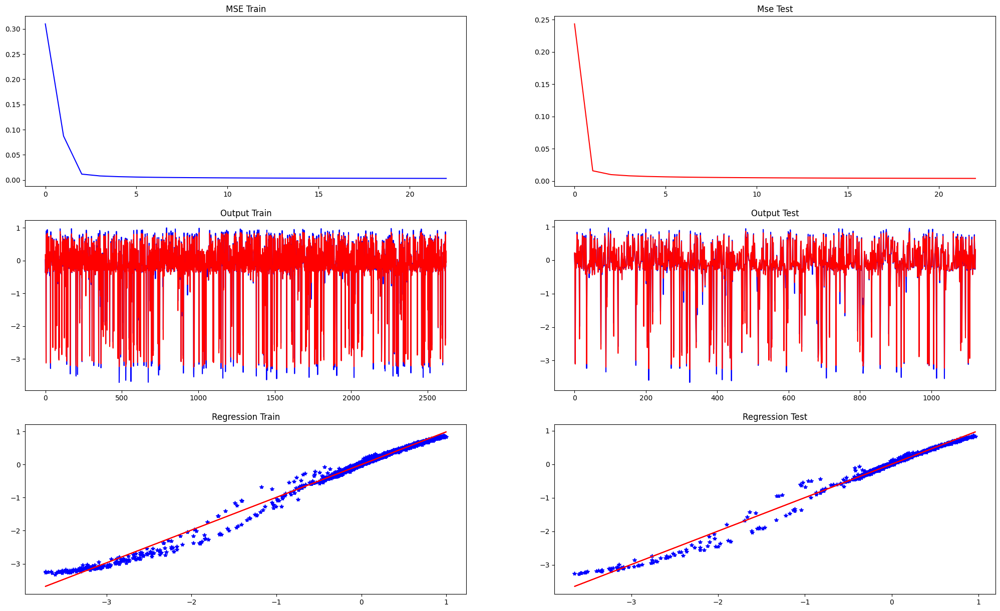

Epoch: 23 	, time: 2.501
MSE_train: 0.0031 	, MSE_test: 0.0038
[0.99011491] [-0.00174742] [0.99760029] [0.00519004]


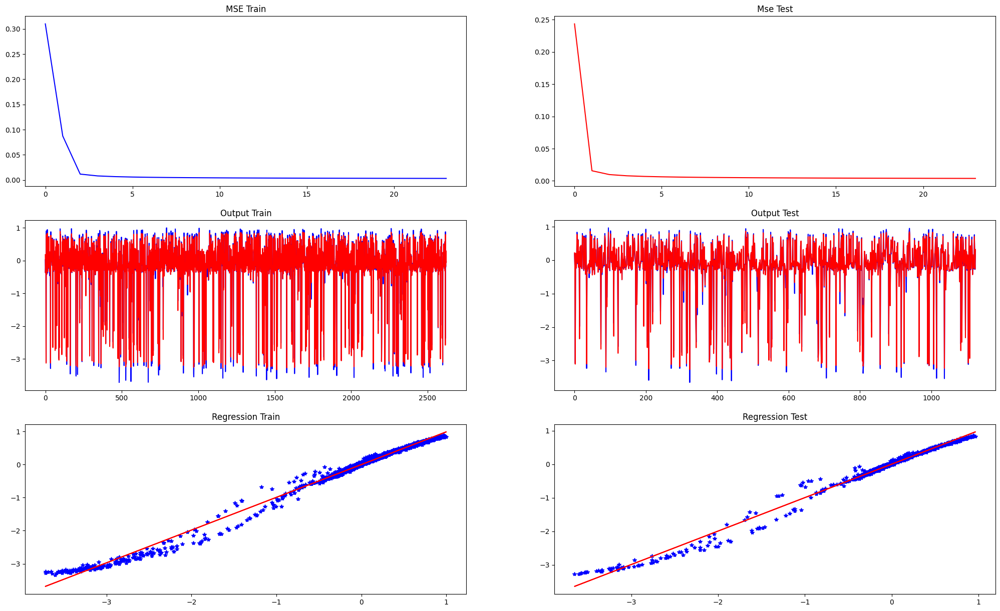

Epoch: 24 	, time: 2.798
MSE_train: 0.0030 	, MSE_test: 0.0038
[0.99027761] [-0.001722] [0.99767782] [0.00523783]


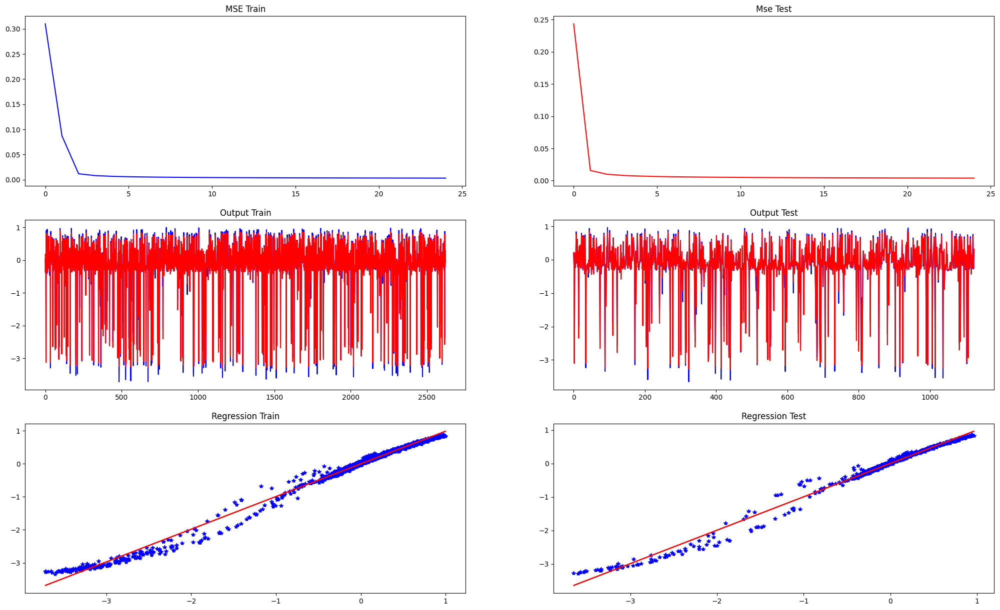

Epoch: 25 	, time: 2.565
MSE_train: 0.0030 	, MSE_test: 0.0038
[0.9904293] [-0.00169806] [0.99774917] [0.00528255]


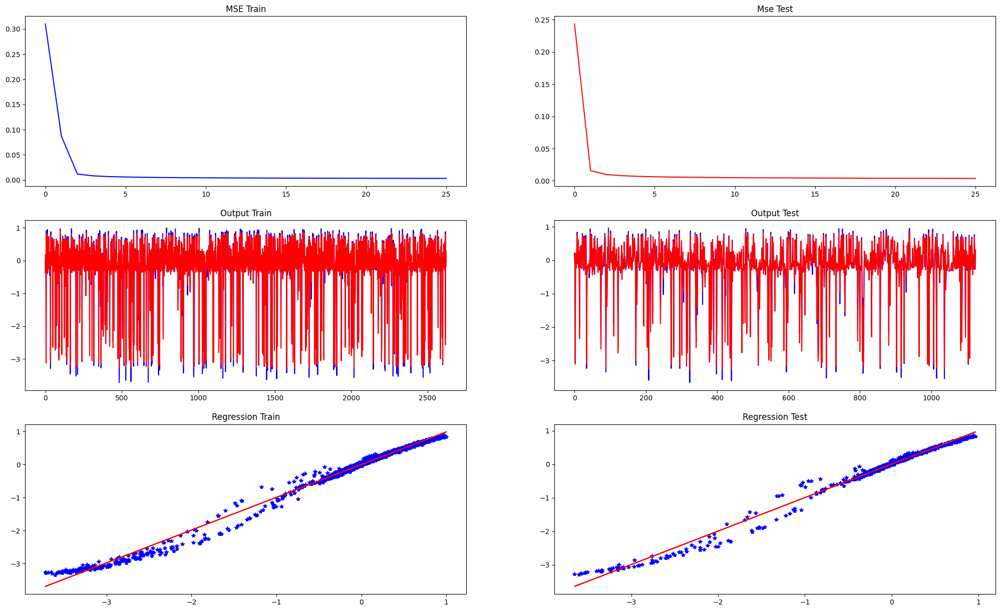

Epoch: 26 	, time: 3.377
MSE_train: 0.0029 	, MSE_test: 0.0037
[0.99057119] [-0.00167546] [0.99781506] [0.00532453]


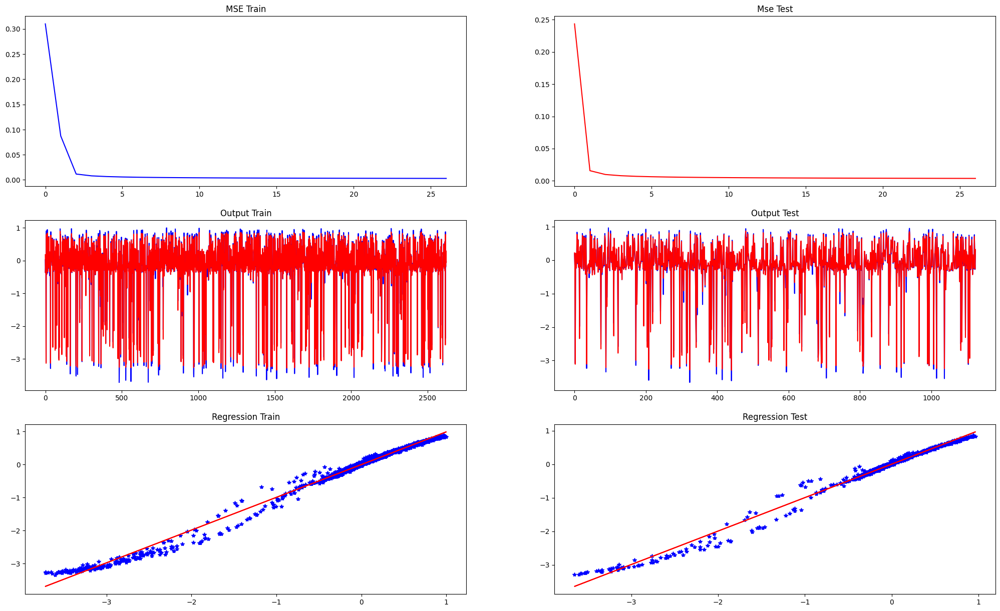

Epoch: 27 	, time: 2.714
MSE_train: 0.0029 	, MSE_test: 0.0037
[0.99070429] [-0.00165407] [0.99787609] [0.00536404]


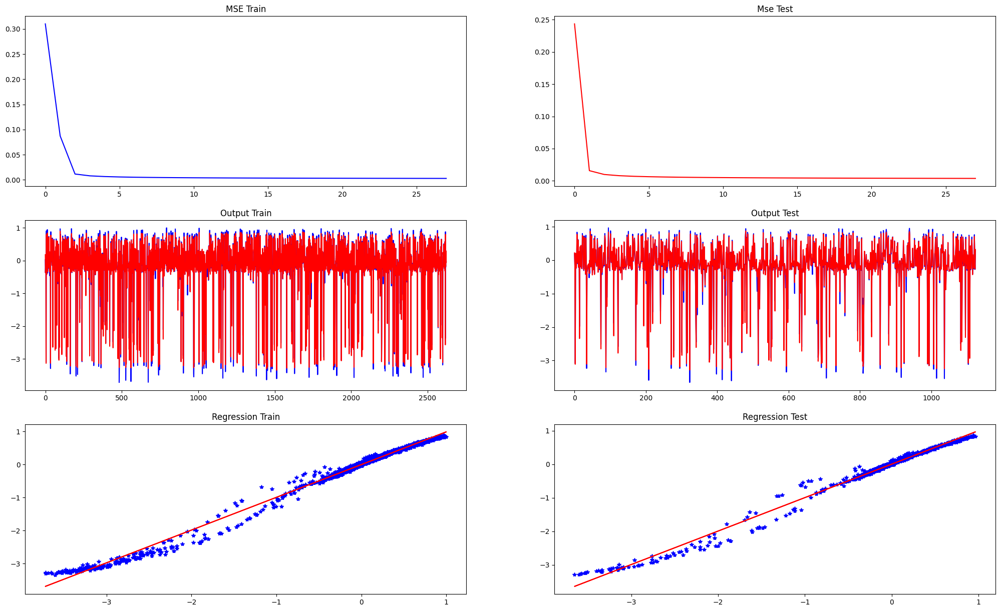

Epoch: 28 	, time: 2.929
MSE_train: 0.0029 	, MSE_test: 0.0036
[0.9908295] [-0.00163379] [0.99793278] [0.00540132]


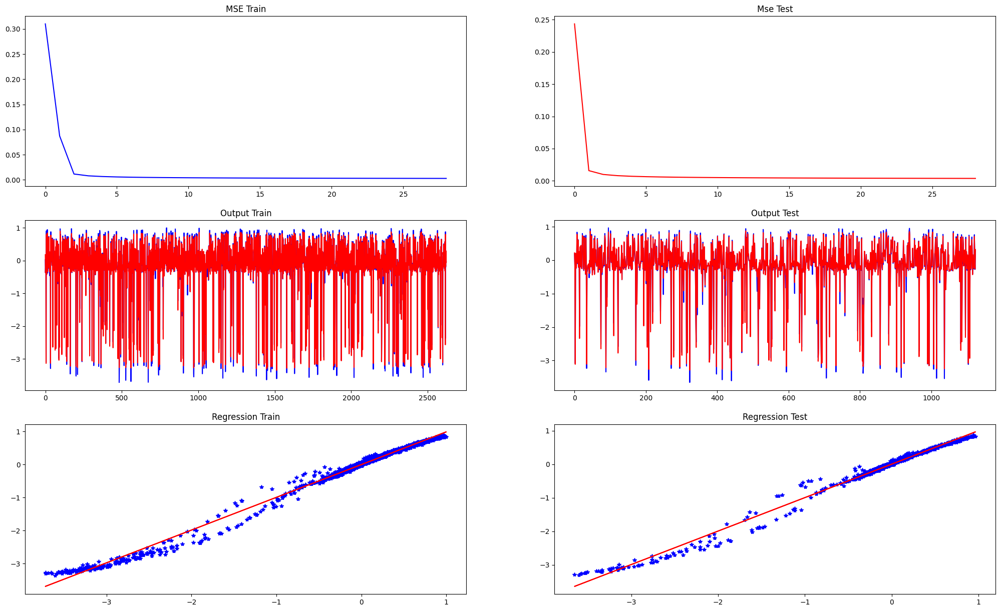

Epoch: 29 	, time: 2.547
MSE_train: 0.0028 	, MSE_test: 0.0036
[0.99094757] [-0.00161452] [0.99798559] [0.00543658]


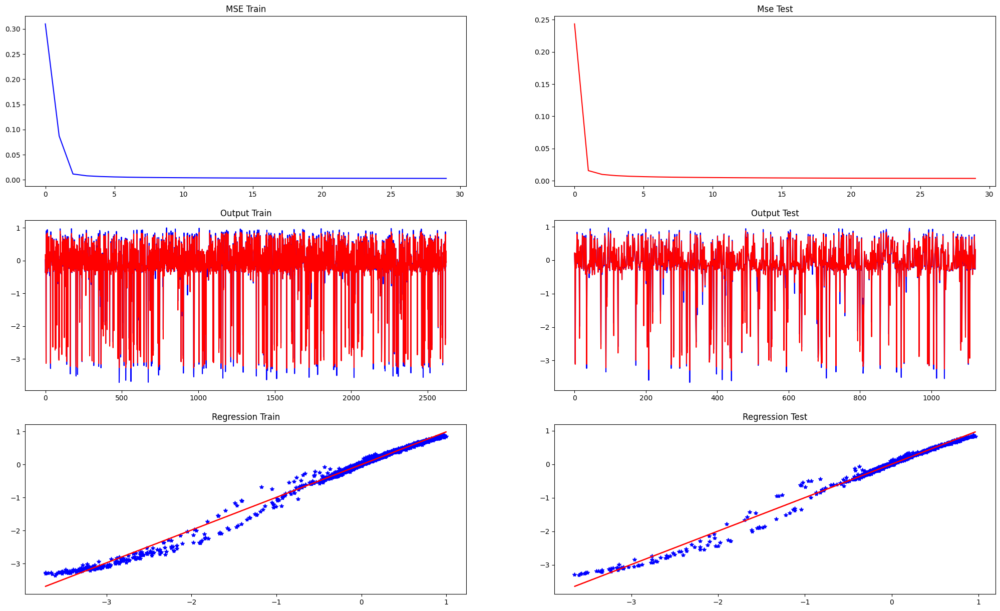

Epoch: 30 	, time: 2.608
MSE_train: 0.0028 	, MSE_test: 0.0036
[0.99105917] [-0.00159618] [0.99803489] [0.00546999]


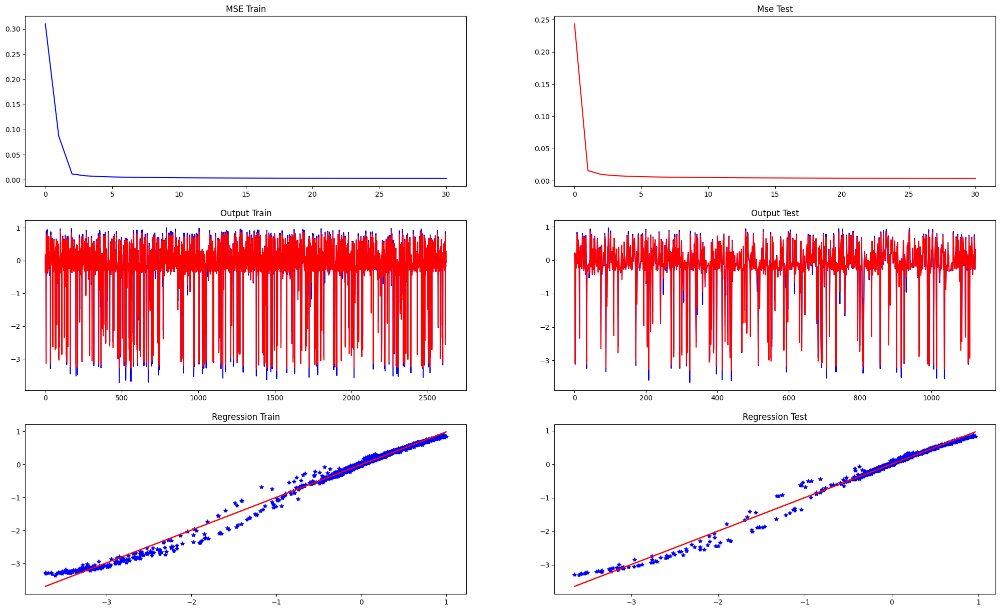

Epoch: 31 	, time: 3.410
MSE_train: 0.0028 	, MSE_test: 0.0035
[0.99116488] [-0.00157869] [0.99808103] [0.00550173]


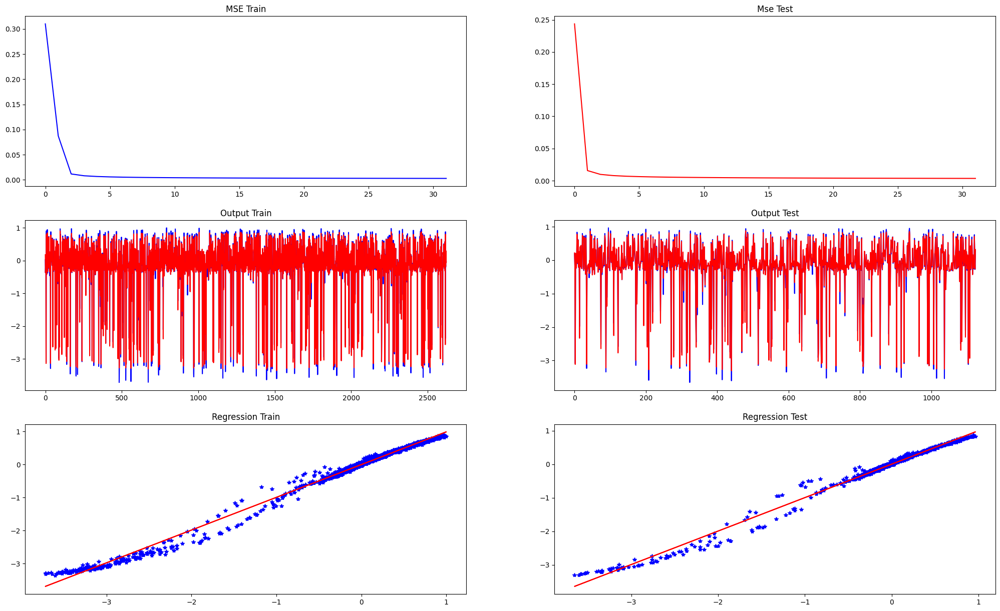

Epoch: 32 	, time: 2.895
MSE_train: 0.0027 	, MSE_test: 0.0035
[0.9912652] [-0.00156199] [0.99812431] [0.00553193]


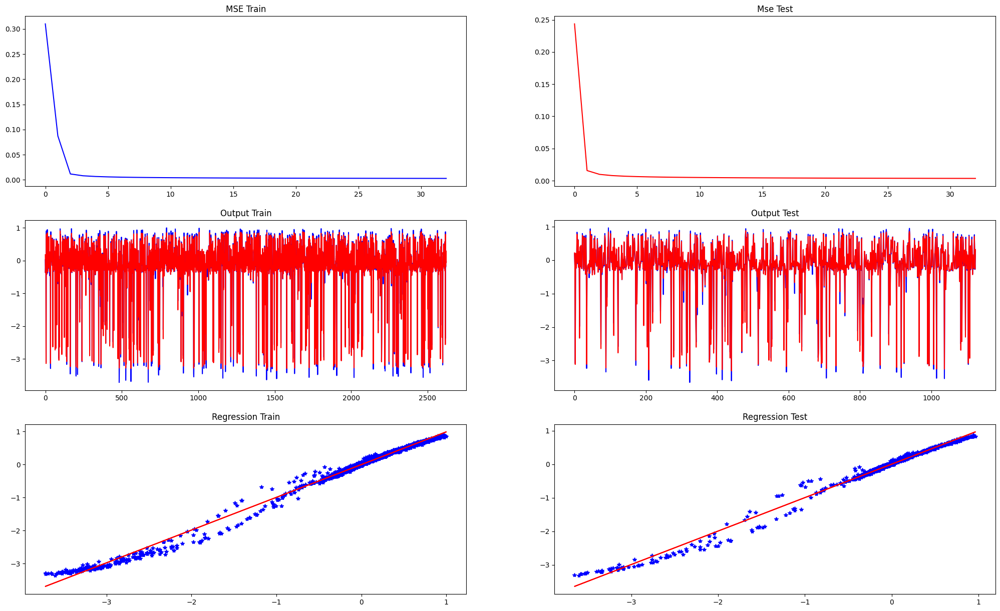

Epoch: 33 	, time: 2.626
MSE_train: 0.0027 	, MSE_test: 0.0035
[0.99136059] [-0.00154603] [0.99816497] [0.00556071]


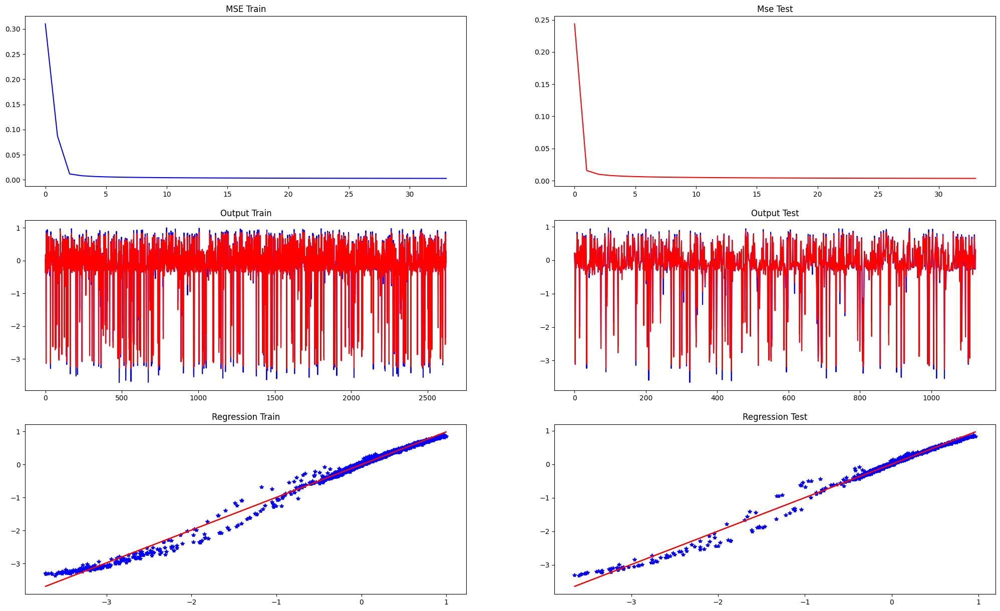

Epoch: 34 	, time: 2.571
MSE_train: 0.0027 	, MSE_test: 0.0034
[0.99145144] [-0.00153074] [0.99820325] [0.00558819]


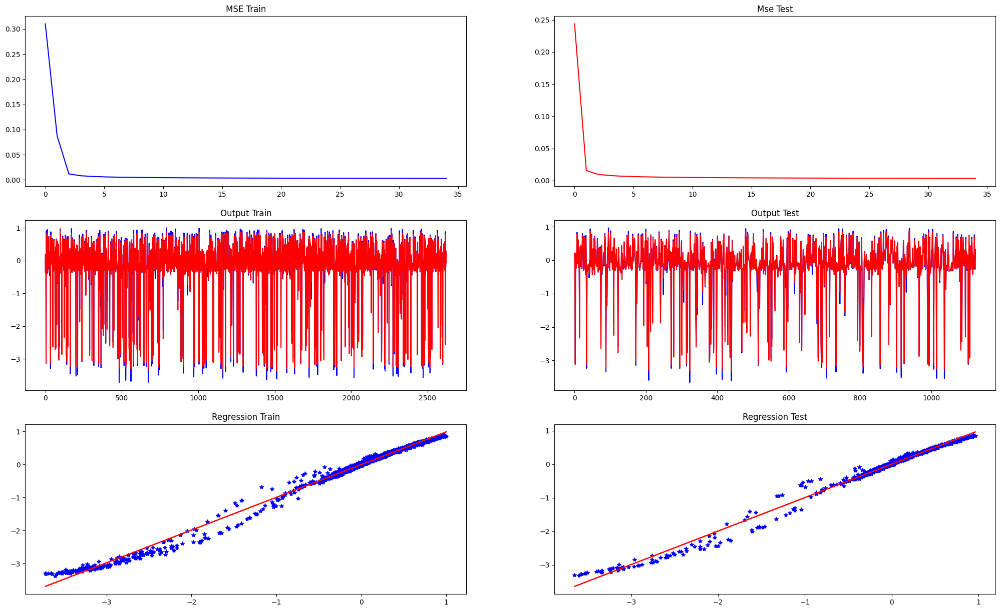

Epoch: 35 	, time: 3.006
MSE_train: 0.0027 	, MSE_test: 0.0034
[0.99153811] [-0.00151608] [0.99823935] [0.00561447]


In [ ]:
print('==> Start Training ...')
for epoch in range(epochs):
    start = timeit.default_timer()

    if epoch % 50 == 0:
        lrw = 0.75 * lrw
        lrm = 0.75 * lrm
        lrs = 0.75 * lrs

    output_train, w, mean, sigma = Train(w, mean, sigma)
    m_train , b_train = np.polyfit(np.reshape(y_train, (1, -1))[0], output_train, 1)
    output_test = Test(w, mean, sigma)
    m_test , b_test = np.polyfit(np.reshape(y_test, (1, -1))[0], output_test, 1)

    Plot_results(output_train,
                 output_test,
                 m_train,
                 b_train,
                 m_test,
                 b_test)

    stop = timeit.default_timer()
    print('Epoch: {} \t, time: {:.3f}'.format(epoch+1, stop-start))
    print('MSE_train: {:.4f} \t, MSE_test: {:.4f}'.format(MSE_train[epoch], MSE_test[epoch]))
    print(m_train, b_train, m_test, b_test)
print('==> End of training ...')


In [ ]:
np.reshape(y_train, (1, -1))[0]

array([ 0.52 ,  0.525, -0.18 , ..., -0.065,  0.54 ,  0.315])

In [ ]:
np.polyfit()